# Progressive rollout — what the noise schedule buys

Sibling notebook to [`edge-collapse-visual.ipynb`](edge-collapse-visual.ipynb), same context and
same budget, one question: **what changes when the horizon carries a per-frame noise ramp instead
of a single shared noise level?**

`R.progressive` implements PA-VDM (Xie et al., [arXiv:2410.08151](https://arxiv.org/abs/2410.08151))
on this denoiser. `imagine` gives every horizon frame the *same* noise level and walks the whole
block to clean at once; `autoregressive` finishes one frame before starting the next. `progressive`
is the continuum between them: hold `window` frames in flight at *staggered* cleanness — nearly
clean at the front, pure noise at the back — and per denoiser pass advance all of them one notch,
**save** the frame that reached clean, **shift**, and **append** a fresh noise frame at the back.

Two reasons to expect this to matter here, and one to expect it not to:

* Nothing about it is a port — `obs_sigma_idx` / `act_sigma_idx` are already `(B, T)`, so per-frame
  levels are natively expressible, and `loss.py`'s `forcing` mode *trains* on exactly this shape
  ("linearly decreasing τ across T, frame 0 cleanest, frame T-1 noisiest"). Check the checkpoint's
  mode weights before reading anything below as in-distribution.
* It sits in the cost gap: `H + K - 1` passes at the default against `K` for `imagine` and `2·H·K`
  for `autoregressive`.
* But PA-VDM optimises **temporal coherence**, and coherence is the *opposite* of siblings
  disagreeing. So the honest prior is that it makes edges better-behaved and **less** diverse —
  which is worth measuring rather than assuming, since the planner needs diversity.

In [19]:
%load_ext autoreload
%autoreload 2
import sys, math, time
import numpy as np
import torch
import matplotlib.pyplot as plt
import mediapy
import cv2
from torch.nn.functional import interpolate
from matplotlib.colors import LinearSegmentedColormap

sys.path.insert(0, '../../..')             # repo root

torch.manual_seed(0)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
resolution = (256, 256)
print('device:', device)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
device: cuda:0


In [20]:
# --- chart tokens ---------------------------------------------------------------------
# One categorical slot per sampler FAMILY (3 is the all-pairs-safe cap for scatter), a
# single-hue ramp for the noise-level heatmaps, and text/grid in ink rather than in a
# series colour. Families, not settings: colour follows the entity, never its rank.
FAM = {'imagine': '#2a78d6', 'progressive': '#eb6834', 'autoregressive': '#1baf7a'}
INK, INK2, GRID, REF = '#0b0b0b', '#52514e', '#d9d8d4', '#8a8a85'
SEQ = LinearSegmentedColormap.from_list('seq_blue', [
    '#cde2fb', '#b7d3f6', '#9ec5f4', '#86b6ef', '#6da7ec', '#5598e7', '#3987e5',
    '#2a78d6', '#256abf', '#1c5cab', '#184f95', '#104281', '#0d366b'])

def style(ax, title=None, xlabel=None, ylabel=None):
    """Recessive axes: no top/right spine, muted grid, ink text."""
    for s in ('top', 'right'):
        ax.spines[s].set_visible(False)
    for s in ('left', 'bottom'):
        ax.spines[s].set_color(GRID)
    ax.tick_params(colors=INK2, labelsize=9)
    ax.grid(alpha=.35, color=GRID, lw=.8)
    ax.set_axisbelow(True)
    if title:  ax.set_title(title, fontsize=11, color=INK, loc='left')
    if xlabel: ax.set_xlabel(xlabel, fontsize=9.5, color=INK2)
    if ylabel: ax.set_ylabel(ylabel, fontsize=9.5, color=INK2)
    return ax

In [21]:
from hydra import initialize_config_dir, compose
from dreamerv4uwm.models.utils import load_tokenizer, load_denoiser
from dreamerv4uwm.datasets import ShardedHDF5Dataset
from dreamerv4uwm.planning import rollout_new as R

CFG_DIR  = '/home/mim-server/projects/felix/dreamerV4-UWM/scripts/config'
DYN_CKPT = '/home/mim-server/projects/rooholla/dreamerV4-UWM/checkpoints/blockcausal/pushT-post-train/97500.pt'
TOK_CKPT = '/home/mim-server/projects/rooholla/dreamerV4-UWM/checkpoints/tokenizer/pushT.pt'
DATA_PATH = '/home/mim-server/datasets/pushT/h5/play'

with initialize_config_dir(version_base=None, config_dir=CFG_DIR):
    cfg = compose(config_name='dynamics/pushT-large', overrides=['denoiser.horizon_aware=false'])
cfg.dynamics_ckpt, cfg.tokenizer_ckpt = DYN_CKPT, TOK_CKPT
denoiser  = load_denoiser(cfg, device, max_num_forward_steps=300).eval().to(device)
tokenizer = load_tokenizer(cfg, device, max_num_forward_steps=300).eval().to(device)
N_LEVELS = int(cfg.denoiser.num_noise_levels)
print('n_actions:', cfg.denoiser.n_actions, '| noise levels:', N_LEVELS)

/home/mim-server/miniconda3/envs/dreamerv4uwm/lib/python3.11/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'dynamics/pushT-large': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)


n_actions: 2 | noise levels: 128


## Display helpers

Identical to `edge-collapse-visual.ipynb`, so every view below reads the same way.

In [22]:
@torch.no_grad()
def decode(lat):
    """Latents (B,T,N,D) -> video (B,T,3,H,W) float[0,1] (bf16 autocast)."""
    with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
        v = tokenizer.decode(lat.to(device))
    return v.float().clamp(0, 1)

def frame_rgb(lat_1frame):
    """(1,1,N,D) latent -> (H,W,3) uint8 RGB."""
    v = decode(lat_1frame)[0, 0]
    return (v.permute(1, 2, 0).clamp(0, 1) * 255).to(torch.uint8).cpu().numpy()

def _strip(video_tchw, n_frames=8, border=2):
    """(T,C,H,W) -> one (H,W,C) uint8 filmstrip, frames evenly spaced, white separators."""
    T = video_tchw.shape[0]
    idx = np.linspace(0, T - 1, min(n_frames, T), dtype=int)
    fr = (video_tchw[idx].cpu().permute(0, 2, 3, 1).float().numpy() * 255).clip(0, 255).astype(np.uint8)
    H, W, C = fr.shape[1:]
    sep = np.full((H, border, C), 255, np.uint8)
    parts = []
    for i, f in enumerate(fr):
        if i:
            parts.append(sep)
        parts.append(f)
    return np.concatenate(parts, axis=1)

def plotComparison(named_videos, n_frames=8, title=None):
    """Stack labeled (T,C,H,W) clips as filmstrip rows (one row per clip)."""
    rows = [(lab, _strip(v, n_frames)) for lab, v in named_videos]
    fig, axes = plt.subplots(len(rows), 1, figsize=(n_frames * 2, 2.0 * len(rows)))
    if len(rows) == 1:
        axes = [axes]
    for ax, (lab, img) in zip(axes, rows):
        ax.imshow(img); ax.set_xticks([]); ax.set_yticks([])
        ax.set_ylabel(lab, rotation=0, ha='right', va='center', fontsize=10)
    if title:
        axes[0].set_title(title, fontsize=12)
    plt.tight_layout(); plt.show()

def plotTerminals(vid, title=None, ncol=None):
    """Grid of the last frame of each sibling video (B,T,3,h,w)."""
    B_ = vid.shape[0]
    ncol = ncol or B_
    nrow = math.ceil(B_ / ncol)
    fig, axes = plt.subplots(nrow, ncol, figsize=(2.2 * ncol, 2.4 * nrow), squeeze=False)
    for i, ax in enumerate(axes.flat):
        if i < B_:
            ax.imshow(vid[i, -1].permute(1, 2, 0).cpu().numpy())
            ax.set_title(f'b={i}', fontsize=9)
        ax.axis('off')
    if title:
        fig.suptitle(title, fontsize=12)
    plt.tight_layout(); plt.show()

def plotSiblingVideos(vid, fps=8, columns=3):
    """Tile the B sibling clips into one inline video grid."""
    arrs = {}
    for b in range(vid.shape[0]):
        a_ = (vid[b].cpu().permute(0, 2, 3, 1).float().numpy() * 255).clip(0, 255).astype(np.uint8)
        arrs[f'b={b}'] = a_
    mediapy.show_videos(arrs, fps=fps, columns=columns, height=200)

def plotActionPaths(a, ca=None, title=None):
    """Overlay the B action sequences (B,H,2); grey = context actions (1,Tc,2)."""
    a_np = a.float().cpu().numpy()
    fig, ax = plt.subplots(1, 3, figsize=(15, 4.2))
    if ca is not None:
        c = ca[0].float().cpu().numpy()
        ax[0].plot(c[:, 0], c[:, 1], '-o', c='0.6', ms=3, lw=1.5, label='context (real)')
        ax[0].scatter(c[-1, 0], c[-1, 1], c='k', s=60, zorder=5, label='decision point')
    for b in range(a_np.shape[0]):
        ax[0].plot(a_np[b, :, 0], a_np[b, :, 1], '-o', ms=3, alpha=.85, label=f'b={b}')
        ax[1].plot(a_np[b, :, 0], alpha=.85)
        ax[2].plot(a_np[b, :, 1], alpha=.85)
    ax[0].set(xlabel='action dim 0', ylabel='action dim 1', title='action paths in 2-D')
    ax[0].legend(fontsize=8); ax[0].grid(alpha=.3); ax[0].set_aspect('equal', 'datalim')
    ax[1].set(xlabel='frame', ylabel='action dim 0', title='dim 0 vs time'); ax[1].grid(alpha=.3)
    ax[2].set(xlabel='frame', ylabel='action dim 1', title='dim 1 vs time'); ax[2].grid(alpha=.3)
    if title:
        fig.suptitle(title, fontsize=12)
    plt.tight_layout(); plt.show()

def get_window(idx):
    batch = dataset[idx]
    imgs = interpolate(batch['image'], resolution).to(device)[None]
    actions = batch['action'][:, :cfg.denoiser.n_actions][None].to(device)
    with torch.no_grad(), torch.autocast(device_type='cuda', dtype=torch.bfloat16):
        latents = tokenizer.encode(imgs).float()
    return imgs, actions, latents

## The context

The same decision point as `edge-collapse-visual.ipynb` — one shared context, `B` siblings drawn
from it — so the two notebooks' views can be put next to each other.

Train split: 64694 windows from 11 episodes
dataset size: 64694


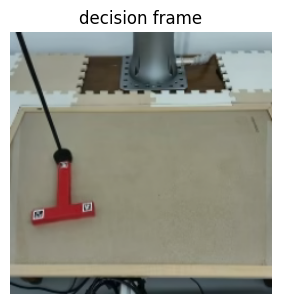

note: only 13 of 16 real continuation frames exist after t=51 (window is 64 frames) -> View 8 compares the first 13
cost of one edge, H=16 K=10:
  imagine                      10 denoiser passes
  progressive window=10         25 passes
  progressive window=5          40 passes
  progressive window=2          85 passes
  progressive window=1         160 passes
  autoregressive              320 passes


In [23]:
dataset = ShardedHDF5Dataset(data_dir=DATA_PATH, window_size=64, stride=1, split='train',
                             train_fraction=0.9, split_seed=123, shuffle_windows=False)
print('dataset size:', len(dataset))

WINDOW_SEED = 1234
T0     = 50        # decision at frame T0 + T_CTX
T_CTX  = 1         # context frames
B      = 6         # siblings drawn from this one context
H      = 16        # edge horizon (frames per rollout)
K      = 10        # Euler steps per FRAME (progressive) / per rollout (imagine)

imgs, actions, latents = get_window(WINDOW_SEED)
cz = latents[:, T0:T0 + T_CTX].clone()      # (1,Tc,N,D)
ca = actions[:, T0:T0 + T_CTX].clone()      # (1,Tc,n_act)
# the demo's own continuation from this decision point (ground truth for View 8). The dataset
# window is only 64 frames long, so near its end this is SHORTER than H — View 8 therefore
# compares over the overlapping prefix rather than silently padding.
real = latents[:, T0 + T_CTX:T0 + T_CTX + H].clone()
H_REAL = real.shape[1]

plt.figure(figsize=(3.4, 3.4))
plt.imshow(frame_rgb(cz[:, -1:])); plt.axis('off'); plt.title('decision frame'); plt.show()
if H_REAL < H:
    print(f'note: only {H_REAL} of {H} real continuation frames exist after t={T0+T_CTX} '
          f'(window is {latents.shape[1]} frames) -> View 8 compares the first {H_REAL}')

print(f'cost of one edge, H={H} K={K}:')
print(f'  imagine                    {K:4d} denoiser passes')
for w in (K, 5, 2, 1):
    print(f'  progressive window={w:<2d}       {R.progressive_steps(H, K, w):4d} passes')
print(f'  autoregressive             {2*H*K:4d} passes')

## The schedule itself

Before any pictures of pushT: *what is the sampler actually doing?* Both samplers are asked for the
same `H` frames with the same `K` Euler steps per frame; they differ only in **which frame sits at
which noise level, when**.

Rather than re-deriving the schedule for the plot (which could drift from the code), wrap the
denoiser in a spy and read back the `obs_sigma_idx` the rollout genuinely asked for.

In [24]:
class SigmaSpy:
    """Transparent denoiser wrapper that records every noise-level vector it is asked for.

    Lets a rollout run *unchanged* and be plotted from what it actually did, instead of from a
    re-implementation of the schedule. Forwards `cfg` / `parameters()` so `_dims` and
    `_resolve_device` still work.
    """

    def __init__(self, d):
        self._d, self.cfg, self.calls = d, d.cfg, []

    def parameters(self):
        return self._d.parameters()

    def __call__(self, **kw):
        ih = kw['is_horizon'].tolist()
        self.calls.append(dict(obs=kw['obs_sigma_idx'][0].tolist(),
                               n_ctx=sum(1 for f in ih if f == 0)))   # is_horizon==0 = clean block
        return self._d(**kw)


def noise_matrix(spy, Tc0, H):
    """(n_passes, H) matrix of NOISE level (1 = pure noise, 0 = clean); NaN = not in the window.

    A frame's absolute horizon index is `#already-emitted + slot`, and #emitted is readable off the
    clean block's growth. Also returns, per frame, the pass on which it left the window.
    """
    M = np.full((len(spy.calls), H), np.nan)
    for p, c in enumerate(spy.calls):
        emitted = c['n_ctx'] - Tc0                       # assumes max_ctx=None (context only grows)
        for j, idx in enumerate(c['obs'][c['n_ctx']:]):
            if emitted + j < H:
                M[p, emitted + j] = 1.0 - idx / N_LEVELS
    last = [np.max(np.nonzero(~np.isnan(M[:, f]))[0]) for f in range(H)]
    return M, last


spy_i, spy_p = SigmaSpy(denoiser), SigmaSpy(denoiser)
g = lambda s=0: torch.Generator(device=device).manual_seed(s)
_ = R.imagine(spy_i, cz, ca, H, B=1, K=K, generator=g())
_ = R.progressive(spy_p, cz, ca, H, B=1, K=K, generator=g())
print(f'imagine     {len(spy_i.calls):3d} passes')
print(f'progressive {len(spy_p.calls):3d} passes')

imagine      10 passes
progressive  25 passes


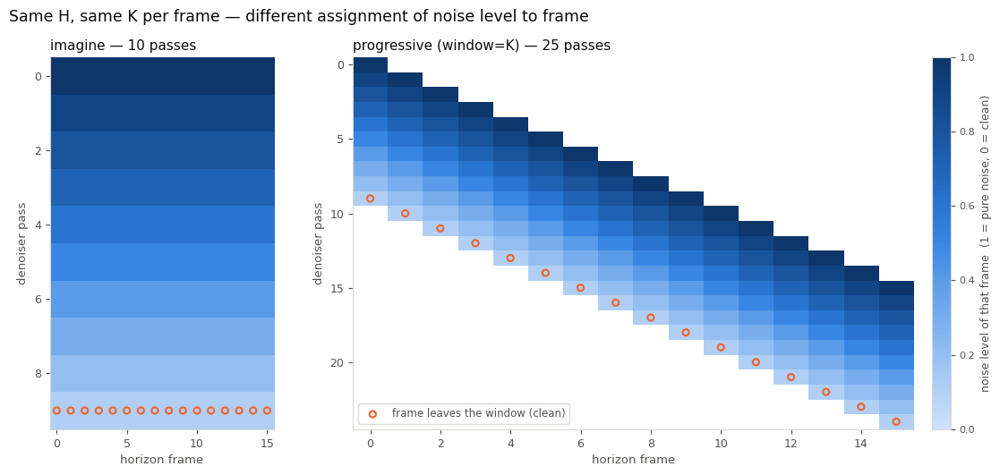

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5.4),
                         gridspec_kw={'width_ratios': [len(spy_i.calls), len(spy_p.calls)]})
for ax, spy, name in zip(axes, (spy_i, spy_p), ('imagine', 'progressive (window=K)')):
    M, last = noise_matrix(spy, T_CTX, H)
    im = ax.imshow(M, cmap=SEQ, vmin=0, vmax=1, aspect='auto', interpolation='nearest')
    ax.scatter(range(H), last, s=26, marker='o', facecolor='none',
               edgecolor='#eb6834', lw=1.6, zorder=3, label='frame leaves the window (clean)')
    style(ax, title=f'{name} — {len(spy.calls)} passes',
          xlabel='horizon frame', ylabel='denoiser pass')
    ax.grid(False)
axes[1].legend(fontsize=8.5, loc='lower left', framealpha=.92, edgecolor=GRID,
               labelcolor=INK2)      # right panel only: its lower-left triangle is empty
cb = fig.colorbar(im, ax=axes, fraction=.022, pad=.02)
cb.set_label('noise level of that frame  (1 = pure noise, 0 = clean)', fontsize=9, color=INK2)
cb.ax.tick_params(colors=INK2, labelsize=8)
cb.outline.set_edgecolor(GRID)
fig.suptitle('Same H, same K per frame — different assignment of noise level to frame',
             fontsize=12.5, color=INK, x=.09, ha='left')
plt.show()

Read the two panels as *when is each frame at which noise level*:

* **`imagine`** — every row is one flat colour. All `H` frames share a level and go clean together,
  on the last pass. Frame 15 is exactly as uncertain as frame 0 the whole way down, and the whole
  edge exists only at the very end.
* **`progressive`** — every row is a gradient, and the diagonal is the point. A frame is born at
  pure noise at the back, drifts forward through the ramp as later frames are born behind it, and
  leaves as clean (orange rings). At any pass the model sees a near-clean immediate future and an
  increasingly vague far future — the same shape as the `forcing` training mode.

The diagonal is the whole mechanism: frame `t+1` is being denoised while frame `t` is *almost*
settled, so it can commit to what is already nearly decided while staying free further out.

## View 1 — the siblings, one row each

imagine         10 passes    4.9s
progressive     25 passes    9.3s


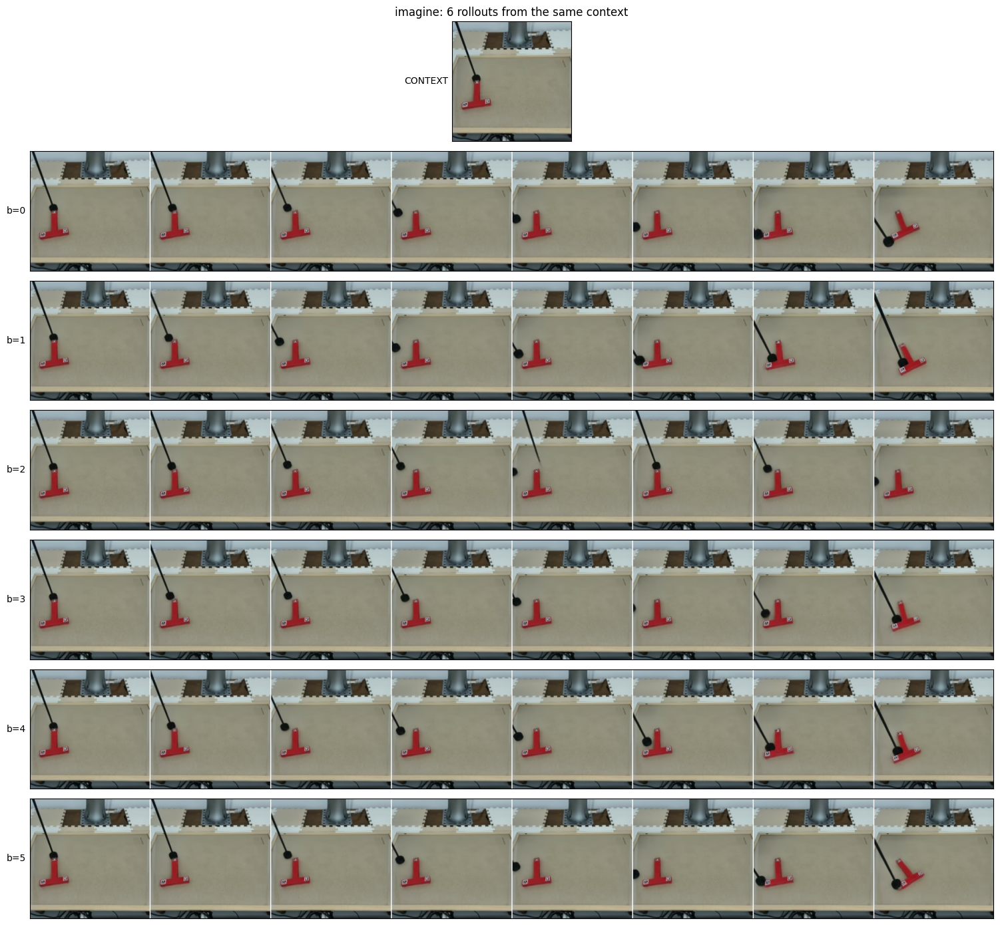

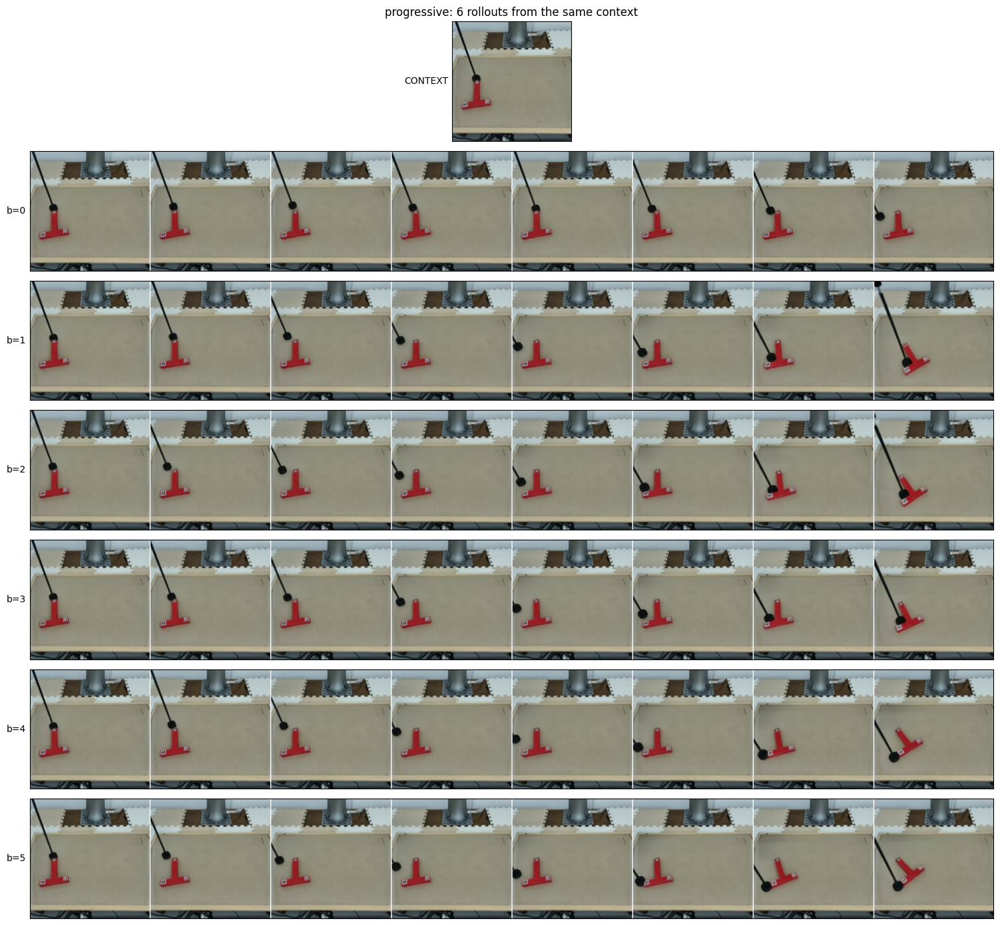

In [26]:
@torch.no_grad()
def siblings(sampler='progressive', seed=0, uncond=False, **kw):
    """B rollouts from the SAME context. -> (videos (B,H,3,h,w), z, a, n_passes).

    One entry point for every sampler so a row of this notebook only ever changes ONE thing.
    `uncond=True` drops the context (`ctx_z = ctx_a = None`) — the diversity ceiling.
    """
    g = torch.Generator(device=device).manual_seed(seed)
    c_z, c_a = (None, None) if uncond else (cz, ca)
    fn = dict(imagine=R.imagine, progressive=R.progressive, autoregressive=R.autoregressive)[sampler]
    n = dict(imagine=K, autoregressive=2 * H * K).get(
        sampler, R.progressive_steps(H, K, kw.get('window')))
    z, a = fn(denoiser, c_z, c_a, H, B=B, K=K, device=device, generator=g, **kw)
    return decode(z), z, a, n


runs = {}
for name, kw in [('imagine', dict(sampler='imagine')),
                 ('progressive', dict(sampler='progressive'))]:
    t = time.time()
    runs[name] = siblings(**kw)
    print(f'{name:<14} {runs[name][3]:3d} passes  {time.time()-t:5.1f}s')

for name in runs:
    plotComparison([('CONTEXT', decode(cz)[0])] + [(f'b={b}', runs[name][0][b]) for b in range(B)],
                   n_frames=8, title=f'{name}: {B} rollouts from the same context')

## View 2 — the terminal frames

These are the `B` child nodes a planner would actually get to choose between.

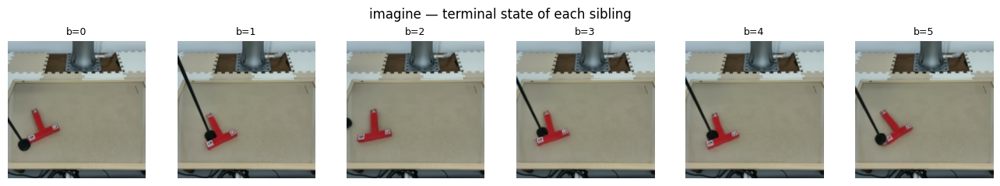

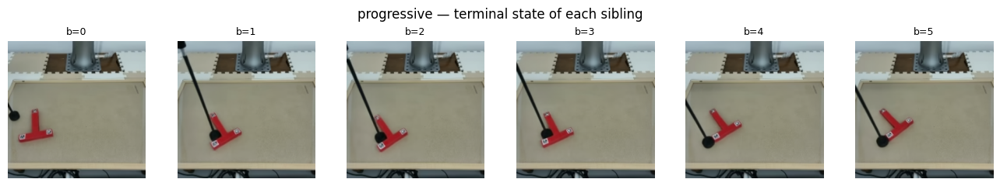

In [27]:
for name in runs:
    plotTerminals(runs[name][0], title=f'{name} — terminal state of each sibling')

## View 3 — play them side by side

In [28]:
for name in runs:
    print(name)
    plotSiblingVideos(runs[name][0])

imagine


progressive


## View 4 — the action paths

The cleanest read on collapse: pushT actions are 2-D, so the `B` sampled sequences can be drawn
directly. Paths lying on top of one another mean the sampler drew the same plan `B` times.

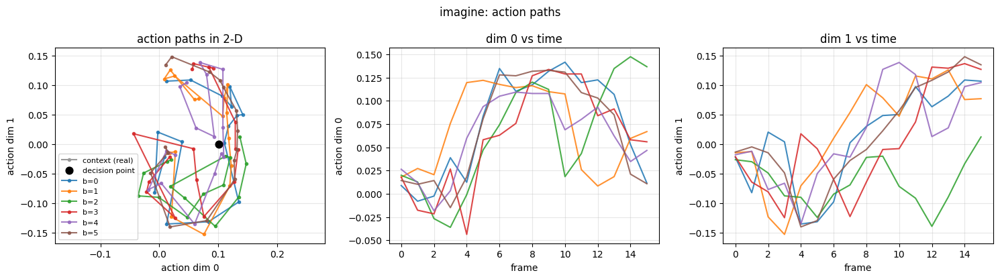

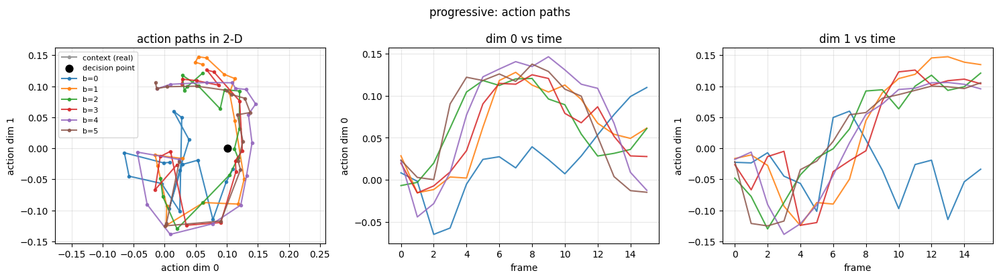

In [29]:
for name in runs:
    plotActionPaths(runs[name][2], ca, title=f'{name}: action paths')

## View 5 — `window`, the dial

`window` is how many frames are in flight, i.e. how much neighbouring frames' denoising overlaps:

* `window=1` — strict frame-by-frame autoregression. Each frame is walked all the way to clean,
  conditioned only on already-realised frames. `H·K` passes.
* `window=K` (default, the paper's `F=S`) — maximum overlap, shift every pass. `H+K-1` passes.

Same context, same seed, same `K`; only the overlap changes. Cost changes a lot, so read the
pass count next to each row.

*(`window` values that do not divide `K` round the stride up and quietly run a smaller window —
`progressive_steps` reports the truth.)*

window=1    160 passes   42.4s
window=2     85 passes   24.2s
window=5     40 passes   12.8s
window=10    25 passes    8.9s


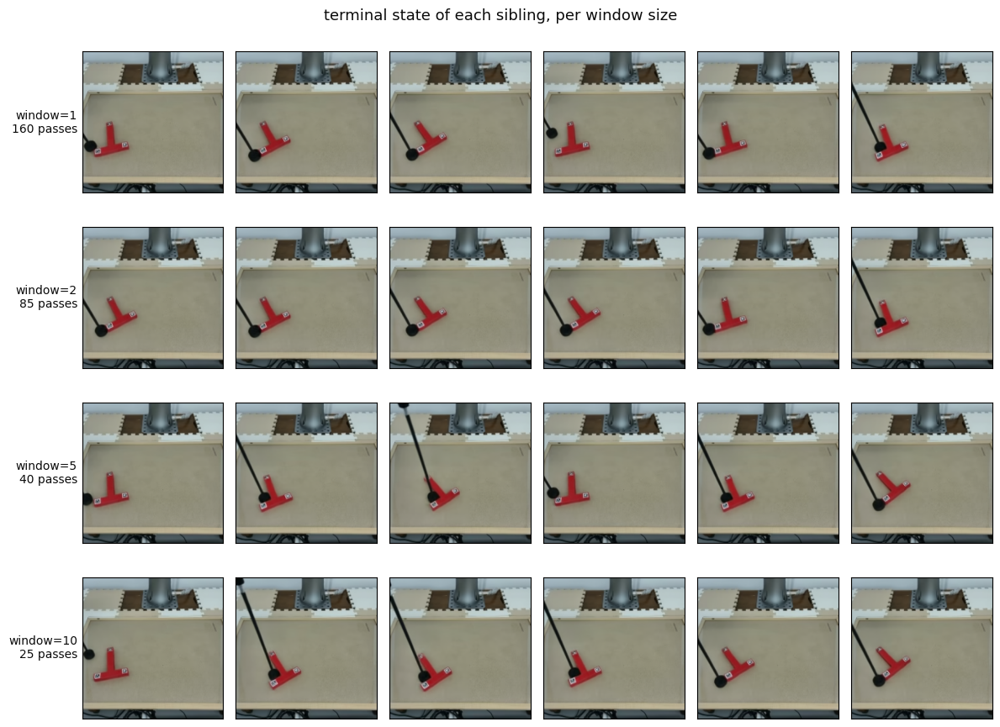

In [30]:
WINDOWS = [1, 2, 5, K]
win_runs = {}
for w in WINDOWS:
    t = time.time()
    win_runs[w] = siblings(sampler='progressive', window=w)
    print(f'window={w:<3d} {win_runs[w][3]:4d} passes  {time.time()-t:5.1f}s')

fig, axes = plt.subplots(len(WINDOWS), B, figsize=(2.0 * B, 2.25 * len(WINDOWS)))
for r, w in enumerate(WINDOWS):
    v, _, _, n = win_runs[w]
    for b in range(B):
        axes[r, b].imshow(v[b, -1].permute(1, 2, 0).cpu().numpy())
        axes[r, b].set_xticks([]); axes[r, b].set_yticks([])
    axes[r, 0].set_ylabel(f'window={w}\n{n} passes', rotation=0, ha='right', va='center',
                          fontsize=10, color=INK)
fig.suptitle('terminal state of each sibling, per window size', fontsize=13, color=INK)
plt.tight_layout(); plt.show()

## View 6 — overlapped conditioning (`max_ctx`)

The paper's other technique (their §3.4): keep a chunk of already-clean frames in the attention
window, or the later frames cannot see what the earlier ones settled on and the video jitters.
Here that is `max_ctx` — emitted frames are appended to the context, and `max_ctx` caps how many
survive:

* `None` (default) — keep them all. Maximum grounding in the rollout's own realised past.
* `n` — keep the most recent `n`.
* `0` — keep none. The paper's no-overlap ablation. With `T_CTX=1` this is severe: after the first
  frame lands, the rollout has **no clean frames at all** and is running near-unconditionally.

This is the knob to watch, because "how tightly is the edge pinned to its own history" is exactly
the diversity question the planner cares about.

max_ctx=None    25 passes    8.7s
max_ctx=4       25 passes    6.7s
max_ctx=1       25 passes    5.5s
max_ctx=0       25 passes    5.1s


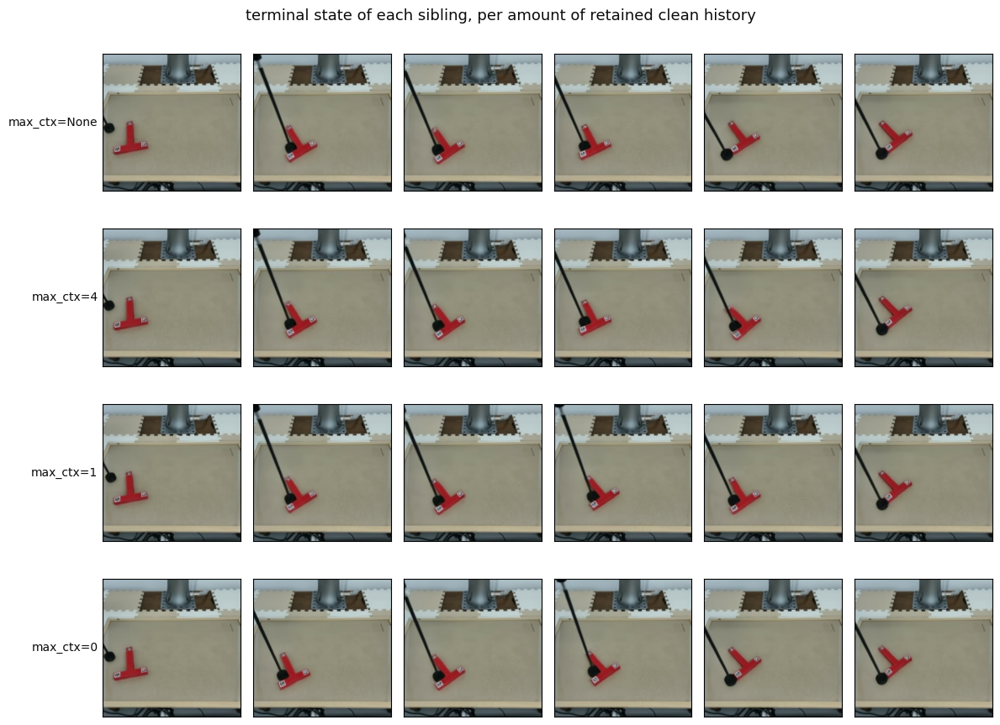

In [31]:
MAXCTX = [None, 4, 1, 0]
ctx_runs = {}
for m in MAXCTX:
    t = time.time()
    ctx_runs[m] = siblings(sampler='progressive', max_ctx=m)
    print(f'max_ctx={str(m):<5} {ctx_runs[m][3]:4d} passes  {time.time()-t:5.1f}s')

fig, axes = plt.subplots(len(MAXCTX), B, figsize=(2.0 * B, 2.25 * len(MAXCTX)))
for r, m in enumerate(MAXCTX):
    v = ctx_runs[m][0]
    for b in range(B):
        axes[r, b].imshow(v[b, -1].permute(1, 2, 0).cpu().numpy())
        axes[r, b].set_xticks([]); axes[r, b].set_yticks([])
    axes[r, 0].set_ylabel(f'max_ctx={m}', rotation=0, ha='right', va='center',
                          fontsize=10, color=INK)
fig.suptitle('terminal state of each sibling, per amount of retained clean history',
             fontsize=13, color=INK)
plt.tight_layout(); plt.show()

## View 7 — the operating points

Eyeballing terminal frames stops working once there are a dozen settings, so measure. Diversity is
scored in the **T-pose descriptor space** the sweep already uses (`TPoseDescriptor` → centroid,
axis, √area of the segmented T), not in raw latent space — `metrics.py`'s `outcome_div` in
everything but name.

Plotted against cost, because a sampler is only interesting if it beats what the same number of
denoiser passes buys elsewhere.

In [32]:
from dreamerv4uwm.planning.experiments.study.descriptors import TPoseDescriptor
from dreamerv4uwm.planning.experiments.study.metrics import _pairwise

desc = TPoseDescriptor(decode_fn=decode, center_xy=(0.5, 0.5), sigma=0.25)

def diversity(z, a):
    """(pose_div, action_div, found_frac) for one sibling set — the sweep's own D-family metrics."""
    phi, found = desc(z[:, -1])                                   # terminal frame of each sibling
    A = a.reshape(a.shape[0], -1).float().cpu().numpy()
    pose = _pairwise(phi[found])[0] if found.sum() >= 2 else float('nan')
    return pose, _pairwise(A)[0], found.mean()


POINTS = [
    ('imagine',                'imagine',        dict(sampler='imagine')),
    ('imagine ctx_noise=.5',   'imagine',        dict(sampler='imagine', ctx_noise=.5)),
    ('imagine a_temp=1.5',     'imagine',        dict(sampler='imagine', action_temp=1.5)),
    ('progressive w=K',        'progressive',    dict(sampler='progressive')),
    ('progressive w=5',        'progressive',    dict(sampler='progressive', window=5)),
    ('progressive w=1',        'progressive',    dict(sampler='progressive', window=1)),
    ('progressive max_ctx=1',  'progressive',    dict(sampler='progressive', max_ctx=1)),
    ('progressive max_ctx=0',  'progressive',    dict(sampler='progressive', max_ctx=0)),
    ('progressive ctx_noise=.5', 'progressive',  dict(sampler='progressive', ctx_noise=.5)),
    ('autoregressive',         'autoregressive', dict(sampler='autoregressive')),
]

rows = []
for label, fam, kw in POINTS:
    t = time.time()
    _, z, a, n = siblings(**kw)
    pose, act, found = diversity(z, a)
    rows.append(dict(label=label, fam=fam, passes=n, secs=time.time() - t,
                     pose=pose, act=act, found=found))
    print(f'{label:<26} {n:4d} passes {rows[-1]["secs"]:5.1f}s  '
          f'pose_div={pose:.4f}  action_div={act:.4f}  T found {found*100:3.0f}%')

_, z_u, a_u, _ = siblings(sampler='progressive', uncond=True)
ceiling = diversity(z_u, a_u)[0]
print(f'\nunconditional ceiling (no context at all): pose_div={ceiling:.4f}')

imagine                      10 passes   5.4s  pose_div=0.3317  action_div=0.3823  T found 100%
imagine ctx_noise=.5         10 passes   5.5s  pose_div=0.3794  action_div=0.5169  T found 100%
imagine a_temp=1.5           10 passes   5.4s  pose_div=0.3351  action_div=0.3851  T found 100%
progressive w=K              25 passes   9.2s  pose_div=0.3121  action_div=0.3472  T found 100%
progressive w=5              40 passes  13.0s  pose_div=0.4561  action_div=0.3854  T found 100%
progressive w=1             160 passes  42.8s  pose_div=0.4725  action_div=0.3619  T found 100%
progressive max_ctx=1        25 passes   5.6s  pose_div=0.3013  action_div=0.3549  T found 100%
progressive max_ctx=0        25 passes   5.1s  pose_div=0.3111  action_div=0.3186  T found 100%
progressive ctx_noise=.5     25 passes   9.2s  pose_div=0.1499  action_div=0.2853  T found 100%
autoregressive              320 passes  83.9s  pose_div=0.3261  action_div=0.3179  T found 100%

unconditional ceiling (no context at al

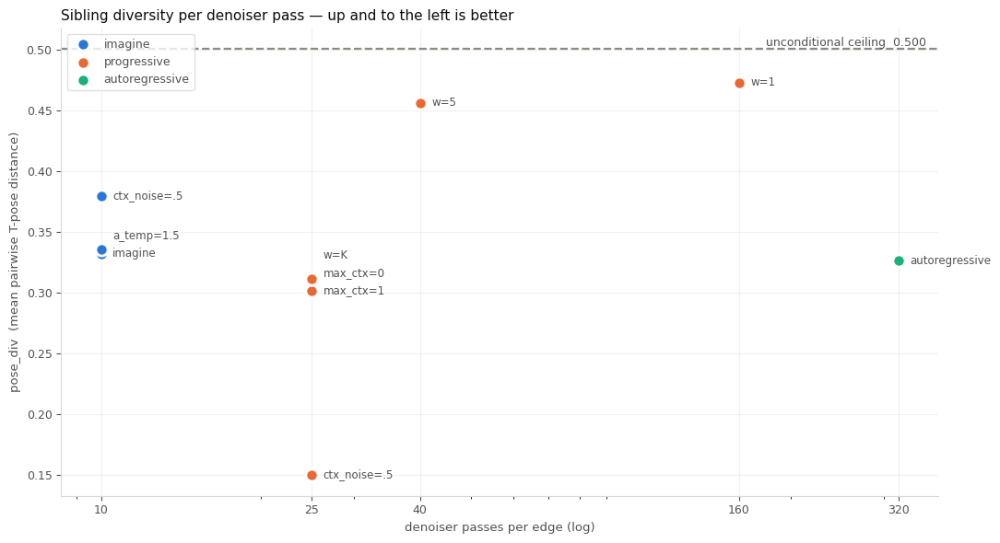

In [33]:
fig, ax = plt.subplots(figsize=(11, 6))
for fam, colour in FAM.items():
    pts = [r for r in rows if r['fam'] == fam]
    ax.scatter([r['passes'] for r in pts], [r['pose'] for r in pts], s=90, color=colour,
               edgecolor='white', linewidth=2, zorder=3, label=fam)
# direct labels (identity is never colour-alone), stacked so same-cost points don't overprint
sep = (max(r['pose'] for r in rows) - min(r['pose'] for r in rows)) * .045
by_x = {}
for r in rows:
    by_x.setdefault(r['passes'], []).append(r)
for x, grp in by_x.items():
    last = -np.inf
    for r in sorted(grp, key=lambda r: r['pose']):
        ly = max(r['pose'], last + sep)
        ax.annotate(r['label'].replace(r['fam'], '').strip() or r['fam'], (x, ly),
                    textcoords='offset points', xytext=(9, 0), fontsize=8.5,
                    color=INK2, va='center')
        last = ly
ax.axhline(ceiling, color=REF, lw=1.6, ls='--', zorder=1)   # after the marks: xlim is settled
ax.text(.995, ceiling, f'unconditional ceiling  {ceiling:.3f}  ', va='bottom', ha='right',
        fontsize=9, color=INK2, transform=ax.get_yaxis_transform())
ax.set_xscale('log')
ax.set_xticks(sorted({r['passes'] for r in rows}))
ax.get_xaxis().set_major_formatter(plt.ScalarFormatter())
style(ax, title='Sibling diversity per denoiser pass — up and to the left is better',
      xlabel='denoiser passes per edge (log)', ylabel='pose_div  (mean pairwise T-pose distance)')
ax.legend(fontsize=9, edgecolor=GRID, labelcolor=INK2, loc='upper left')
plt.tight_layout(); plt.show()

## View 8 — but does it move?

Low `pose_div` is only good news if the rollouts *go somewhere*. A sampler that freezes the scene
scores a perfect zero on diversity and is useless. So track the T's centroid over every frame and
compare against the demo's own continuation from the same decision point — the one trajectory we
know is real.

`net` = start→end displacement, `path` = summed frame-to-frame motion, `jerk` = mean change in step
size (the jitter PA-VDM's overlapped conditioning exists to prevent).

Read the `net` column against the demo's first: if the samplers come in far below it, the siblings
are *disagreeing while standing still*, and the diversity numbers in View 7 are measuring drift
rather than genuinely different plans.

In [34]:
centroid = TPoseDescriptor(decode_fn=decode, use_theta=False, use_area=False,
                           center_xy=(0.5, 0.5), sigma=0.25)          # centroid only
start = centroid(cz[:, -1])[0][0]
real_p = centroid(real[0])[0]

def motion(z):
    """Per-sibling centroid path -> (net, path, mean step, jerk, per-frame step curve).

    Truncated to `H_REAL` frames so every row — samplers and demo alike — is scored over the
    same stretch of time.
    """
    z = z[:, :H_REAL]
    p = centroid(z.reshape(-1, z.shape[-2], z.shape[-1]))[0].reshape(z.shape[0], z.shape[1], 2)
    seg = np.linalg.norm(np.diff(p, axis=1), axis=-1)
    return (np.linalg.norm(p[:, -1] - start, axis=-1).mean(), seg.sum(1).mean(),
            seg.mean(), np.abs(np.diff(seg, axis=1)).mean(), seg.mean(0))

seg_r = np.linalg.norm(np.diff(real_p, axis=0), axis=-1)
net_real = float(np.linalg.norm(real_p[-1] - start))      # the yardstick, reused in View 9
print(f'over the first {H_REAL} frames (all the demo continuation this window holds)\n')
print(f'{"":<26} {"net":>7} {"path":>7} {"step":>7} {"jerk":>7}')
print(f'{"REAL demo continuation":<26} {net_real:7.4f} {seg_r.sum():7.4f} '
      f'{seg_r.mean():7.4f} {np.abs(np.diff(seg_r)).mean():7.4f}')
print('-' * 60)
CURVES = [('imagine', 'imagine', dict(sampler='imagine')),
          ('progressive w=K', 'progressive', dict(sampler='progressive')),
          ('progressive max_ctx=0', 'progressive', dict(sampler='progressive', max_ctx=0))]
curves = {}
for label, fam, kw in CURVES:
    net, path, step, jerk, curve = motion(siblings(**kw)[1])
    curves[label] = (fam, curve)
    print(f'{label:<26} {net:7.4f} {path:7.4f} {step:7.4f} {jerk:7.4f}')

over the first 13 frames (all the demo continuation this window holds)

                               net    path    step    jerk
REAL demo continuation      0.0457  0.0576  0.0048  0.0033
------------------------------------------------------------
imagine                     0.0062  0.0124  0.0010  0.0008
progressive w=K             0.0153  0.0218  0.0018  0.0013
progressive max_ctx=0       0.0146  0.0230  0.0019  0.0014


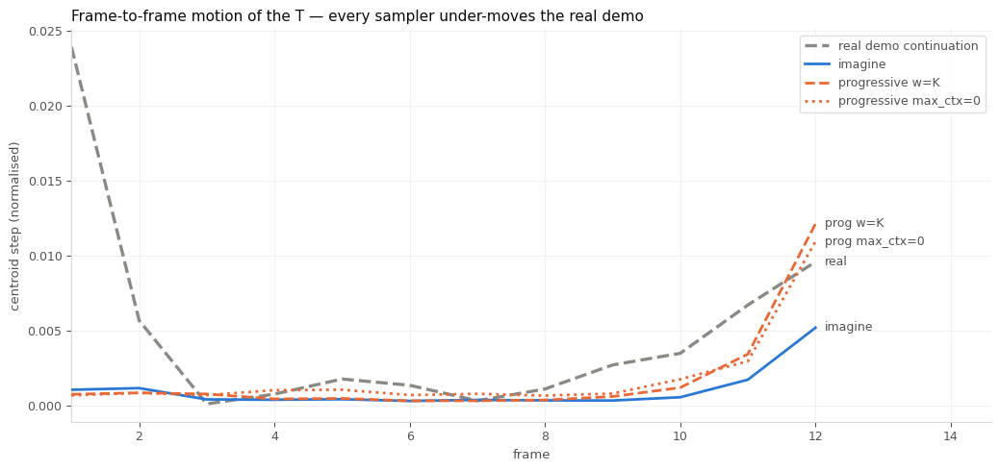

In [35]:
fig, ax = plt.subplots(figsize=(10.5, 5))
ax.plot(range(1, H_REAL), seg_r, color=REF, lw=2.4, ls='--', zorder=2, label='real demo continuation')
ax.annotate('real', (H_REAL - 1, seg_r[-1]), textcoords='offset points', xytext=(7, 0),
            fontsize=9, color=INK2, va='center')
for i, (label, (fam, curve)) in enumerate(curves.items()):
    ls = ['-', '--', ':'][i % 3]                      # secondary encoding, not colour alone
    ax.plot(range(1, H_REAL), curve, color=FAM[fam], lw=2, ls=ls, zorder=3, label=label)
    ax.annotate(label.replace('progressive ', 'prog '), (H_REAL - 1, curve[-1]),
                textcoords='offset points', xytext=(7, 0), fontsize=9, color=INK2, va='center')
style(ax, title='Frame-to-frame motion of the T — every sampler under-moves the real demo',
      xlabel='frame', ylabel='centroid step (normalised)')
ax.set_xlim(1, H_REAL + 1.6)
ax.legend(fontsize=9, edgecolor=GRID, labelcolor=INK2)
plt.tight_layout(); plt.show()

## View 9 — the knob that actually matters

Everything above holds `T_CTX = 1` fixed, and at one context frame the model has **no velocity
cue**: it cannot know which way the T was already moving. That should make it both uncertain (wide
posterior → high `pose_div`) and bad at continuing the demo (View 8's `net` far below the real
row). Both are visible above, which makes the sampler comparison suspect — siblings that disagree
while standing still are not siblings offering different *plans*.

So hold the decision frame fixed and vary only how much history precedes it. This is the control
the whole notebook needs: if context length moves diversity more than the sampler choice does, then
`progressive` vs `imagine` is a second-order question and View 7's ranking is noise on top of a
much larger effect.

In [36]:
CTX_LENS = [1, 2, 4, 8]
DECISION = T0 + T_CTX                                  # keep the decision frame fixed
ctx_rows = []
for tc in CTX_LENS:
    czt = latents[:, DECISION - tc:DECISION].clone()
    cat = actions[:, DECISION - tc:DECISION].clone()
    st = centroid(czt[:, -1])[0][0]
    for fam, fn, kw in [('imagine', R.imagine, {}), ('progressive', R.progressive, {})]:
        gg = torch.Generator(device=device).manual_seed(0)
        z, a = fn(denoiser, czt, cat, H, B=B, K=K, device=device, generator=gg, **kw)
        phi, found = desc(z[:, -1])
        p = centroid(z[:, :H_REAL].reshape(-1, z.shape[-2], z.shape[-1]))[0].reshape(B, H_REAL, 2)
        ctx_rows.append(dict(tc=tc, fam=fam,
                             pose=_pairwise(phi[found])[0] if found.sum() >= 2 else np.nan,
                             net=np.linalg.norm(p[:, -1] - st, axis=-1).mean()))
        print(f'T_CTX={tc}  {fam:<12} pose_div={ctx_rows[-1]["pose"]:.4f}  '
              f'net={ctx_rows[-1]["net"]:.4f} ({ctx_rows[-1]["net"]/net_real:.2f}x real)')
    print()

T_CTX=1  imagine      pose_div=0.3317  net=0.0062 (0.14x real)
T_CTX=1  progressive  pose_div=0.3121  net=0.0153 (0.33x real)

T_CTX=2  imagine      pose_div=0.5564  net=0.0152 (0.33x real)
T_CTX=2  progressive  pose_div=0.4972  net=0.0119 (0.26x real)

T_CTX=4  imagine      pose_div=0.4497  net=0.0516 (1.13x real)
T_CTX=4  progressive  pose_div=0.4171  net=0.0490 (1.07x real)

T_CTX=8  imagine      pose_div=0.0013  net=0.0533 (1.17x real)
T_CTX=8  progressive  pose_div=0.0016  net=0.0490 (1.07x real)



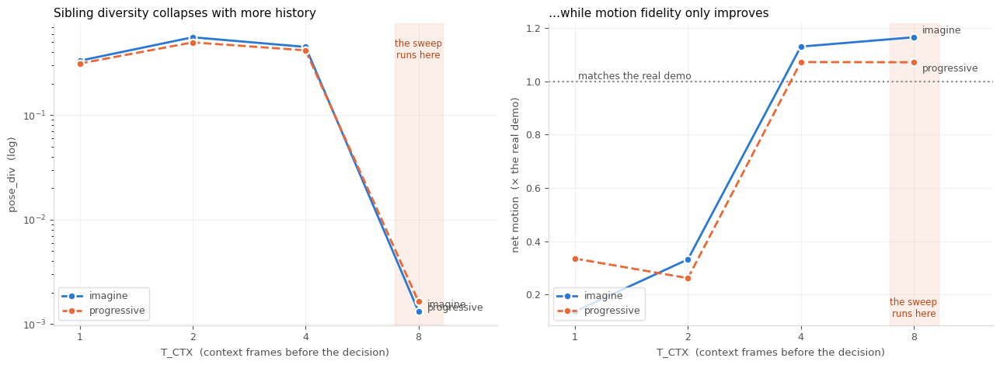

In [37]:
fig, axes = plt.subplots(1, 2, figsize=(13, 4.8))
for dy, fam in ((6, 'imagine'), (-6, 'progressive')):     # stagger: the two collide at Tc=8
    pts = [r for r in ctx_rows if r['fam'] == fam]
    ls = '-' if fam == 'imagine' else '--'                    # not colour alone
    for ax, key in zip(axes, ('pose', 'net')):
        y = [r[key] / (1 if key == 'pose' else net_real) for r in pts]
        ax.plot([r['tc'] for r in pts], y, ls, color=FAM[fam], lw=2, marker='o', ms=7,
                mec='white', mew=1.6, label=fam, zorder=3)
        ax.annotate(fam, (pts[-1]['tc'], y[-1]), textcoords='offset points', xytext=(8, dy),
                    fontsize=9, color=INK2, va='center')
axes[0].set_yscale('log')
style(axes[0], title='Sibling diversity collapses with more history',
      xlabel='T_CTX  (context frames before the decision)', ylabel='pose_div  (log)')
axes[1].axhline(1.0, color=REF, lw=1.6, ls=':', zorder=1)
axes[1].text(1, 1.0, ' matches the real demo', fontsize=9, color=INK2, va='bottom')
style(axes[1], title='…while motion fidelity only improves',
      xlabel='T_CTX  (context frames before the decision)', ylabel='net motion  (× the real demo)')
for ax in axes:
    ax.set_xscale('log', base=2)          # 1,2,4,8 evenly spaced: the cliff's shape is then honest
    ax.set_xticks(CTX_LENS)
    ax.get_xaxis().set_major_formatter(plt.ScalarFormatter())
    ax.set_xlim(.85, 13)
    ax.axvspan(6.9, 9.3, color='#eb6834', alpha=.10, zorder=0)   # where the sweep actually runs
    ax.legend(fontsize=9, edgecolor=GRID, labelcolor=INK2, loc='lower left')
    top = ax is axes[0]              # left panel's data hugs the bottom at Tc=8, right panel's the top
    ax.text(8, .95 if top else .02, 'the sweep\nruns here', fontsize=8.5, color='#b8471a',
            ha='center', va='top' if top else 'bottom', transform=ax.get_xaxis_transform())
plt.tight_layout(); plt.show()

That is the notebook's real result, and it is not about the sampler.

`T_CTX` moves `pose_div` by **orders of magnitude**; `progressive` vs `imagine` moves it by a few
percent at every context length. And the two axes are not in conflict the way a diversity↔fidelity
trade normally is: going from 4 to 8 context frames costs essentially *all* the sibling diversity
and buys almost **no** extra motion fidelity — the model already tracks the demo at `T_CTX=4`. That
is not a trade, it is a cliff.

The shaded band is where the study currently lives: `config/inits/pushT_curated.yaml` pins `Tc: 8`,
every `config/sweep*.yaml` sets `max_ctx: 8`, and `optimize.py` holds `max_ctx` in its **`FIXED`**
dict so the Bayesian optimiser can never move it. Neither knob appears in any `sweep.ofat` grid.

## View 10 — no context at all

`ctx_z = ctx_a = None`: `progressive` generates its first frame from nothing and conditions on its
own emitted frames thereafter — the pure autoregressive prior over pushT episodes. Conditioning can
only narrow a distribution, so this row bounds what every conditioned row above can reach. Judge it
on spread, not on agreement with the decision frame.

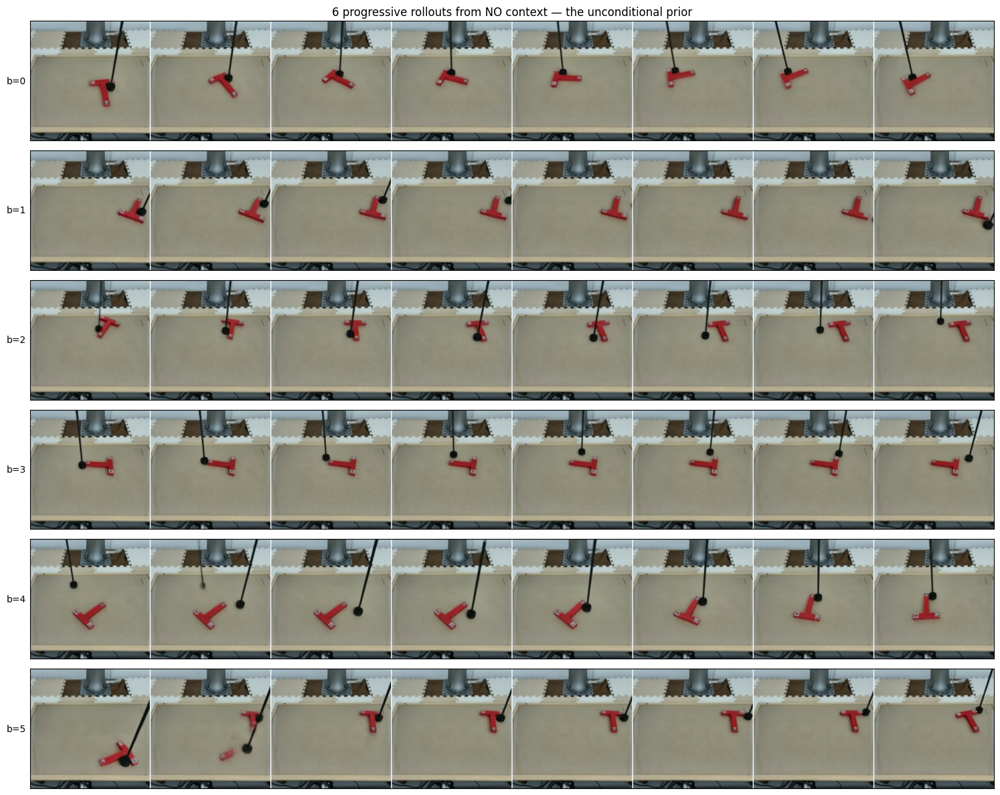

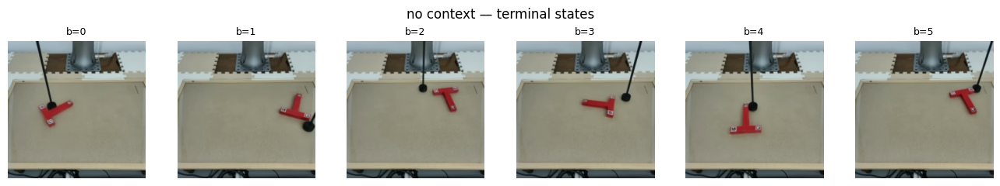

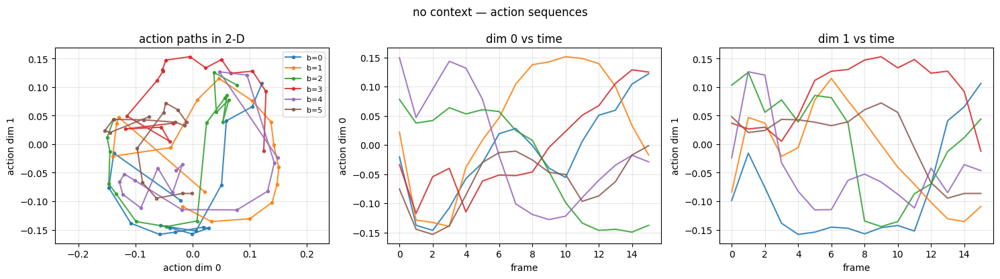

In [38]:
vid_u = decode(z_u)
plotComparison([(f'b={b}', vid_u[b]) for b in range(B)], n_frames=8,
               title=f'{B} progressive rollouts from NO context — the unconditional prior')
plotTerminals(vid_u, title='no context — terminal states')
plotActionPaths(a_u, None, title='no context — action sequences')
plotSiblingVideos(vid_u)

## Where this leaves us

**One decision point, one planner seed, `B=6`.** Everything below is a lead to test on the curated
init set, not a result. With that said, the run above says three things, and the notebook set out
to learn only the first:

1. **`progressive` is a second-order knob.** It is a genuine operating point — it costs `H+K-1`
   passes against `imagine`'s `K` and `autoregressive`'s `2·H·K`, it produces smooth well-formed
   edges, and `window` behaves as advertised. But its sibling diversity lands within a few percent
   of `imagine`'s at every context length tried, consistently a touch *below* it. That is PA-VDM
   working as designed — it optimises temporal coherence, and coherence is the opposite of siblings
   disagreeing — so it is not the lever that fixes edge collapse.
2. **Context length is the first-order knob, and it is a cliff, not a trade.** Going from `T_CTX=4`
   to `T_CTX=8` at the same decision frame costs ~all of the sibling diversity while motion fidelity
   is already saturated at 4. Diversity and fidelity are supposed to trade against each other; here
   the last four context frames buy nothing and cost everything.
3. **The study is parked on the wrong side of that cliff.** `Tc: 8` in the curated inits, `max_ctx:
   8` in every sweep config, `max_ctx` in `optimize.py`'s `FIXED` dict, and neither in any
   `sweep.ofat` grid. If this holds up, the sweeps have been measuring knobs *inside* a regime
   already collapsed by a factor nobody is varying — which would also explain why `ctx_noise` reads
   as the strongest positive factor in the run-1 results: it is the only knob in the grid that
   partially undoes the pinning, and it does so by corrupting the context rather than by shortening
   it.

Worth doing next, roughly in order of value:

* **Test #2 and #3 properly** — `Tc` × `max_ctx` over the curated init set with several seeds.
  Cheap (no new machinery: both are already config fields) and it decides whether the sweep grid
  needs rebuilding before any more GPU hours go into it.
* If it holds, add `max_ctx` to `sweep.ofat` and move it out of `optimize.py`'s `FIXED` into
  `SPACE` — note `plan_frames` already treats `max_ctx` as a cost term, so the BO budget accounting
  keeps working unchanged.
* Only then revisit `progressive` for the planner, and judge it on `g_random_last` rather than on
  diversity — better-grounded edges could still plan better with *less* spread, since diversity is
  a means to planning gain, not the goal. That needs `edge_mode='progressive'` wired into
  `mcts.py` (which still imports the old `rollout`).